In [1]:
import pandas as pd
df = pd.read_excel('Bankruptcy_data_Final.xlsx', header=0)                     #, sheetname='<your sheet>'
df.to_csv('Bankruptcy_data_Final.csv', index=False, encoding='utf-8')

In [1]:
import pandas as pd
df = pd.read_csv('Bankruptcy_data_Final.csv')

In [2]:
df.shape

(92872, 13)

In [3]:
df.head()

,EPS,Liquidity,Profitability,Productivity,Leverage Ratio,Asset Turnover,Operational Margin,Return on Equity,Market Book Ratio,Assets Growth,Sales Growth,Employee Growth,BK
0,1.58,0.36,0.18,0.13,1.33,1.77,0.07,0.15,2.22,NaN,NaN,NaN,0
1,1.41,0.36,0.19,0.12,1.31,1.59,0.07,0.13,2.41,0.126319,0.014278,0.040179,0
2,0.31,0.32,0.13,0.08,1.03,1.55,0.05,0.04,2.56,0.368077,0.327909,0.566524,0
3,0.71,0.28,0.14,0.08,0.80,1.39,0.06,0.05,5.28,-0.020809,-0.118904,-0.095890,0
4,0.75,0.41,0.13,0.08,0.20,1.30,0.06,0.04,8.68,0.233089,0.146807,0.053030,0


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 92872 entries, 0 to 92871
Data columns (total 13 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   EPS                 92867 non-null  float64
 1   Liquidity           92625 non-null  float64
 2   Profitability       92625 non-null  float64
 3   Productivity        92625 non-null  float64
 4   Leverage Ratio      92846 non-null  float64
 5   Asset Turnover      92625 non-null  float64
 6   Operational Margin  87315 non-null  float64
 7   Return on Equity    92864 non-null  float64
 8   Market Book Ratio   92815 non-null  float64
 9   Assets Growth       86171 non-null  float64
 10  Sales Growth        86171 non-null  float64
 11  Employee Growth     85862 non-null  float64
 12  BK                  92872 non-null  int64  
dtypes: float64(12), int64(1)
memory usage: 9.2 MB


In [5]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
EPS,92867.0,-14.461355,2195.467288,-3.840000e+05,-0.140000,0.330000,1.530000,55339.00
Liquidity,92625.0,-2.631237,121.610921,-2.596852e+04,0.020000,0.190000,0.400000,1.00
Profitability,92625.0,-29.537274,677.230667,-7.968200e+04,-0.640000,0.070000,0.310000,140.58
Productivity,92625.0,-1.222870,35.885556,-5.093000e+03,-0.060000,0.060000,0.110000,1102.00
Leverage Ratio,92846.0,1.345316,253.038093,-7.811000e+03,0.000000,0.280000,0.820000,75970.38
Asset Turnover,92625.0,1.053613,2.115945,-3.159000e+01,0.390000,0.830000,1.390000,276.38
Operational Margin,87315.0,-7.915485,214.460079,-3.017570e+04,-0.030000,0.060000,0.140000,394.47
Return on Equity,92864.0,-2.112382,352.596902,-8.887514e+04,-0.080000,0.030000,0.070000,39500.00
Market Book Ratio,92815.0,358.506265,26063.637981,-3.151500e+06,11.200000,58.280000,240.140000,3455419.33
Assets Growth,86171.0,1.294075,73.769522,-1.000000e+00,-0.052596,0.051844,0.192062,14231.00


In [6]:
import numpy as np
import matplotlib.pyplot as plt

import sklearn
import seaborn as sns

## Analysis with Pandas Profiling

In [7]:
# import o ProfileReport
from pandas_profiling import ProfileReport

In [8]:
profile = ProfileReport(df, title='Report - Pandas Profiling', html={'style':{'full_width':True}})
profile

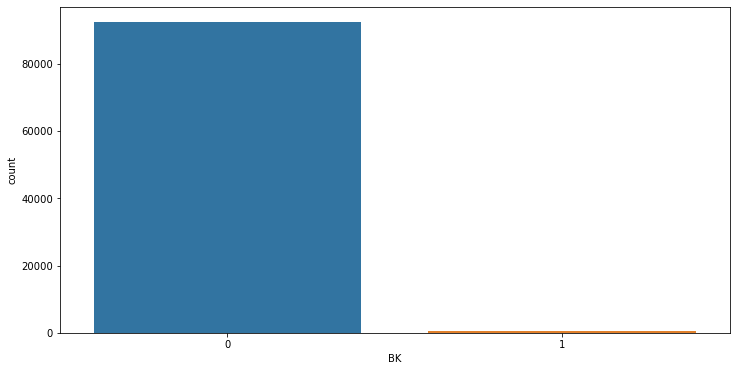

In [9]:
plt.figure(figsize=(12,6))
sns.countplot(df['BK'])
plt.show()

In [10]:
df['BK'].value_counts()

0    92314
1      558
Name: BK, dtype: int64

#### Remove duplicates

In [11]:
df.shape

(92872, 13)

In [12]:
df = df.drop_duplicates()
df.shape

(92845, 13)

In [13]:
np.isnan(df)

,EPS,Liquidity,Profitability,Productivity,Leverage Ratio,Asset Turnover,Operational Margin,Return on Equity,Market Book Ratio,Assets Growth,Sales Growth,Employee Growth,BK
0,False,False,False,False,False,False,False,False,False,True,True,True,False
1,False,False,False,False,False,False,False,False,False,False,False,False,False
2,False,False,False,False,False,False,False,False,False,False,False,False,False
3,False,False,False,False,False,False,False,False,False,False,False,False,False
4,False,False,False,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...
92867,False,False,False,False,False,False,False,False,False,False,False,False,False
92868,False,False,False,False,False,False,False,False,False,False,False,False,False
92869,False,False,False,False,False,False,False,False,False,False,False,False,False
92870,False,False,False,False,False,False,False,False,False,False,False,False,False


#### Fill in empty values 

In [14]:
# Fill in empty values 
df = df.replace(np.nan, 0)

In [15]:
df.columns

Index(['EPS', 'Liquidity', 'Profitability', 'Productivity', 'Leverage Ratio',
       'Asset Turnover', 'Operational Margin', 'Return on Equity',
       'Market Book Ratio', 'Assets Growth', 'Sales Growth', 'Employee Growth',
       'BK'],
      dtype='object')

In [16]:
np.isnan(df['Assets Growth']).value_counts()

False    92845
Name: Assets Growth, dtype: int64

#### Train_Test_Split

In [17]:
X = df.drop('BK', axis=1) 
y = df['BK']

In [23]:
from sklearn.model_selection import train_test_split
# stratify will preserve the proportion of the target
X_train, X_test, y_train, y_test = train_test_split(X, y, stratify=y,random_state=97, test_size = 0.20)

In [19]:
y_test.shape

(18569,)

In [21]:
# install imblearn
!pip install imblearn

ERROR: Could not install packages due to an EnvironmentError: [WinError 5] Acesso negado: 'C:\\Users\\felip\\anaconda3\\Lib\\site-packages\\~klearn\\metrics\\cluster\\_expected_mutual_info_fast.cp38-win_amd64.pyd'
Consider using the `--user` option or check the permissions.



  Attempting uninstall: scikit-learn
    Found existing installation: scikit-learn 0.23.1
    Uninstalling scikit-learn-0.23.1:
      Successfully uninstalled scikit-learn-0.23.1


In [24]:
conda install -c glemaitre imbalanced-learn

Solving environment: ...working... failed with initial frozen solve. Retrying with flexible solve.
Solving environment: ...working... failed with repodata from current_repodata.json, will retry with next repodata source.
Solving environment: ...working... failed with initial frozen solve. Retrying with flexible solve.
Solving environment: ...working... 
Found conflicts! Looking for incompatible packages.
This can take several minutes.  Press CTRL-C to abort.
failed

Note: you may need to restart the kernel to use updated packages.



Examining python=3.8:  75%|#######5  | 3/4 [00:00<00:00,  4.91it/s]                    
                                                                   

Examining conflict for imbalanced-learn python:   0%|          | 0/4 [00:00<?, ?it/s]
                                                                                     

UnsatisfiableError: The following specifications were found
to be incompatible with the existing python installation in your environment:

Specifications:

  - imbalanced-learn -> python[version='2.7.*|3.4.*|3.5.*|3.6.*']

Your python: python=3.8

If python is on the left-most side of the chain, that's the version you've asked for.
When python appears to the right, that indicates that the thing on the left is somehow
not available for the python version you are constrained to. Note that conda will not
change your python version to a different minor version unless you explicitly specify
that.





In [25]:
from imblearn.over_sampling import SMOTE
over = SMOTE(ratio = 0.5)
X_train, y_train = over.fit_resample(X, y)

ModuleNotFoundError: No module named 'imblearn'

In [ ]:
sc = StandardScaler()
X_train_sc = sc.fit_transform(X_train)

In [ ]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.linear_model import LogisticRegression


from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import classification_report
from sklearn.metrics import f1_score
from sklearn.metrics import roc_auc_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import recall_score
from sklearn import datasets, metrics, model_selection, svm


In [ ]:
classifier2 = RandomForestClassifier(max_depth=26, class_weight="balanced_subsample", criterion="gini", random_state=0)
classifier2.fit(X_train,y_train)
y_rfc=classifier2.predict(X_test)

print('Confusion Matrix \n',confusion_matrix(y_rfc,y_test))
print()
print('f1_score \n', f1_score(y_rfc,y_test))
print()
print('average_precision_score \n', average_precision_score(y_rfc,y_test))
print()
print('recall_score \n', recall_score(y_rfc,y_test))
print()
print('Classification Report \n',classification_report(y_rfc,y_test))
metrics.plot_roc_curve(classifier2, X_test, y_test)  
plt.show()  

### 3. Running RFECV

In [ ]:
from sklearn.model_selection import StratifiedKFold
from sklearn.feature_selection import RFECV

In [ ]:
target = df['BK']

rfc = RandomForestClassifier(random_state=101)
rfecv = RFECV(estimator=rfc, step=1, cv=StratifiedKFold(10), scoring='f1')
rfecv.fit(X_train, y_train)

In [ ]:
print('Optimal number of features: {}'.format(rfecv.n_features_))

In [ ]:
rfecv.grid_scores_